In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
import plotly.express as px

In [2]:
df = pd.read_excel('STLGlassPlantData.xlsx')
df

,H2 FLOW,O2 FLOW,SILICA,SUCTION,HTD,TEMP,T SPEED,ROT SPEED,FINAL TIP SPLIT
0,14.278557,11.959736,45.383162,245.0,2.849066,730.949574,0.554771,70.0,7.00
1,15.405924,11.998657,47.735984,241.0,2.018294,723.934370,1.080253,78.0,12.75
2,15.086657,11.735719,44.767447,256.0,2.145396,719.563466,1.239785,84.0,12.00
3,14.647138,12.150333,46.605308,247.0,3.056861,730.191711,1.956044,70.0,10.00
4,17.475638,13.585236,44.571819,241.0,2.753618,731.082674,2.430784,89.0,4.50
...,...,...,...,...,...,...,...,...,...
9267,14.564876,11.952392,48.126070,245.0,1.563538,720.574098,15199.070899,80.0,12.00
9268,13.981428,11.664559,44.535915,219.0,3.700349,726.825115,15939.977419,77.0,8.25
9269,13.728326,11.265781,45.793598,241.0,2.381276,724.841863,16137.704681,80.0,8.25
9270,14.748575,11.637908,46.183873,255.0,3.380966,726.889051,16424.079302,82.0,14.25


In [3]:
# Display the first few rows
print("First few rows of the dataset:")
print(df.head())

First few rows of the dataset:
     H2 FLOW    O2 FLOW     SILICA  SUCTION       HTD        TEMP   T SPEED  \
0  14.278557  11.959736  45.383162    245.0  2.849066  730.949574  0.554771   
1  15.405924  11.998657  47.735984    241.0  2.018294  723.934370  1.080253   
2  15.086657  11.735719  44.767447    256.0  2.145396  719.563466  1.239785   
3  14.647138  12.150333  46.605308    247.0  3.056861  730.191711  1.956044   
4  17.475638  13.585236  44.571819    241.0  2.753618  731.082674  2.430784   

   ROT SPEED  FINAL TIP SPLIT  
0       70.0             7.00  
1       78.0            12.75  
2       84.0            12.00  
3       70.0            10.00  
4       89.0             4.50  


In [4]:
# Display summary statistics
print("\nSummary statistics of the dataset:")
print(df.describe())


Summary statistics of the dataset:
           H2 FLOW      O2 FLOW       SILICA      SUCTION          HTD  \
count  9263.000000  9259.000000  9270.000000  9266.000000  9270.000000   
mean     14.994061    12.038951    46.001955   245.225124     2.823569   
std       1.190652     0.762740     0.908780    15.573492     0.424065   
min      10.117157     9.318286    42.530059   186.000000     0.860012   
25%      14.184537    11.525263    45.387580   235.000000     2.556135   
50%      14.993598    12.040823    46.011936   245.000000     2.866567   
75%      15.805629    12.555975    46.613150   256.000000     3.129538   
max      19.040764    14.876904    49.981548   301.000000     3.995527   

              TEMP       T SPEED    ROT SPEED  FINAL TIP SPLIT  
count  9267.000000   9260.000000  9264.000000      9262.000000  
mean    729.984153   2170.535465    80.162781        11.019785  
std       6.888010   2144.102071     8.937779         3.271399  
min     702.959534      0.554771    5

In [5]:
# Handling missing values
print("Missing values in the dataset:")
print(df.isnull().sum())

Missing values in the dataset:
H2 FLOW             9
O2 FLOW            13
SILICA              2
SUCTION             6
HTD                 2
TEMP                5
T SPEED            12
ROT SPEED           8
FINAL TIP SPLIT    10
dtype: int64


In [6]:
# Fill missing values with the mean of the column
df.fillna(df.mean(), inplace=True)
df

,H2 FLOW,O2 FLOW,SILICA,SUCTION,HTD,TEMP,T SPEED,ROT SPEED,FINAL TIP SPLIT
0,14.278557,11.959736,45.383162,245.0,2.849066,730.949574,0.554771,70.0,7.00
1,15.405924,11.998657,47.735984,241.0,2.018294,723.934370,1.080253,78.0,12.75
2,15.086657,11.735719,44.767447,256.0,2.145396,719.563466,1.239785,84.0,12.00
3,14.647138,12.150333,46.605308,247.0,3.056861,730.191711,1.956044,70.0,10.00
4,17.475638,13.585236,44.571819,241.0,2.753618,731.082674,2.430784,89.0,4.50
...,...,...,...,...,...,...,...,...,...
9267,14.564876,11.952392,48.126070,245.0,1.563538,720.574098,15199.070899,80.0,12.00
9268,13.981428,11.664559,44.535915,219.0,3.700349,726.825115,15939.977419,77.0,8.25
9269,13.728326,11.265781,45.793598,241.0,2.381276,724.841863,16137.704681,80.0,8.25
9270,14.748575,11.637908,46.183873,255.0,3.380966,726.889051,16424.079302,82.0,14.25


In [7]:
# Checking for and removing duplicates
print(df.duplicated().sum())

26


In [8]:
df.drop_duplicates(inplace=True)
df

,H2 FLOW,O2 FLOW,SILICA,SUCTION,HTD,TEMP,T SPEED,ROT SPEED,FINAL TIP SPLIT
0,14.278557,11.959736,45.383162,245.0,2.849066,730.949574,0.554771,70.0,7.00
1,15.405924,11.998657,47.735984,241.0,2.018294,723.934370,1.080253,78.0,12.75
2,15.086657,11.735719,44.767447,256.0,2.145396,719.563466,1.239785,84.0,12.00
3,14.647138,12.150333,46.605308,247.0,3.056861,730.191711,1.956044,70.0,10.00
4,17.475638,13.585236,44.571819,241.0,2.753618,731.082674,2.430784,89.0,4.50
...,...,...,...,...,...,...,...,...,...
9267,14.564876,11.952392,48.126070,245.0,1.563538,720.574098,15199.070899,80.0,12.00
9268,13.981428,11.664559,44.535915,219.0,3.700349,726.825115,15939.977419,77.0,8.25
9269,13.728326,11.265781,45.793598,241.0,2.381276,724.841863,16137.704681,80.0,8.25
9270,14.748575,11.637908,46.183873,255.0,3.380966,726.889051,16424.079302,82.0,14.25


In [9]:
# Feature Engineering (Example: Creating a new feature 'Total' as sum of all numeric columns)
df['Total'] = df.select_dtypes(include=[np.number]).sum(axis=1)
df

,H2 FLOW,O2 FLOW,SILICA,SUCTION,HTD,TEMP,T SPEED,ROT SPEED,FINAL TIP SPLIT,Total
0,14.278557,11.959736,45.383162,245.0,2.849066,730.949574,0.554771,70.0,7.00,1127.974866
1,15.405924,11.998657,47.735984,241.0,2.018294,723.934370,1.080253,78.0,12.75,1133.923481
2,15.086657,11.735719,44.767447,256.0,2.145396,719.563466,1.239785,84.0,12.00,1146.538469
3,14.647138,12.150333,46.605308,247.0,3.056861,730.191711,1.956044,70.0,10.00,1135.607396
4,17.475638,13.585236,44.571819,241.0,2.753618,731.082674,2.430784,89.0,4.50,1146.399768
...,...,...,...,...,...,...,...,...,...,...
9267,14.564876,11.952392,48.126070,245.0,1.563538,720.574098,15199.070899,80.0,12.00,16332.851873
9268,13.981428,11.664559,44.535915,219.0,3.700349,726.825115,15939.977419,77.0,8.25,17044.934784
9269,13.728326,11.265781,45.793598,241.0,2.381276,724.841863,16137.704681,80.0,8.25,17264.965525
9270,14.748575,11.637908,46.183873,255.0,3.380966,726.889051,16424.079302,82.0,14.25,17578.169676


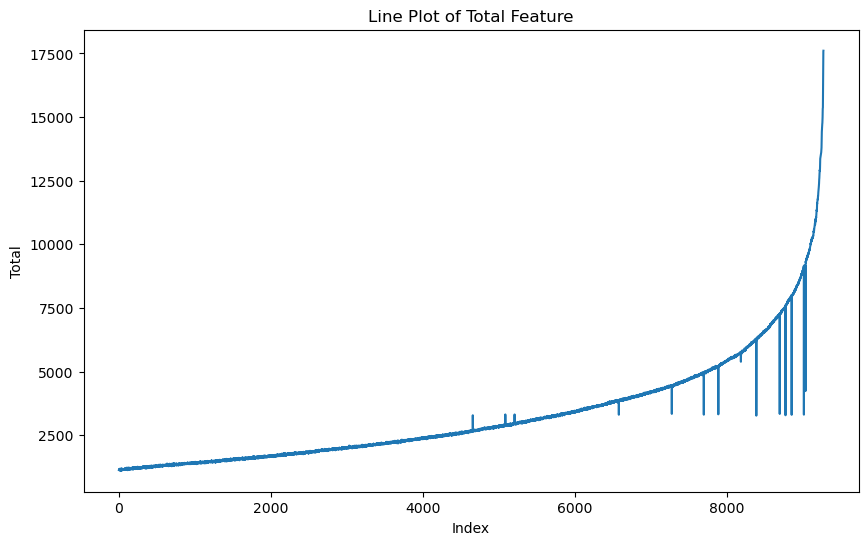

In [10]:
# Line Plot
plt.figure(figsize=(10, 6))
plt.plot(df.index, df['Total'])
plt.title('Line Plot of Total Feature')
plt.xlabel('Index')
plt.ylabel('Total')
plt.show()

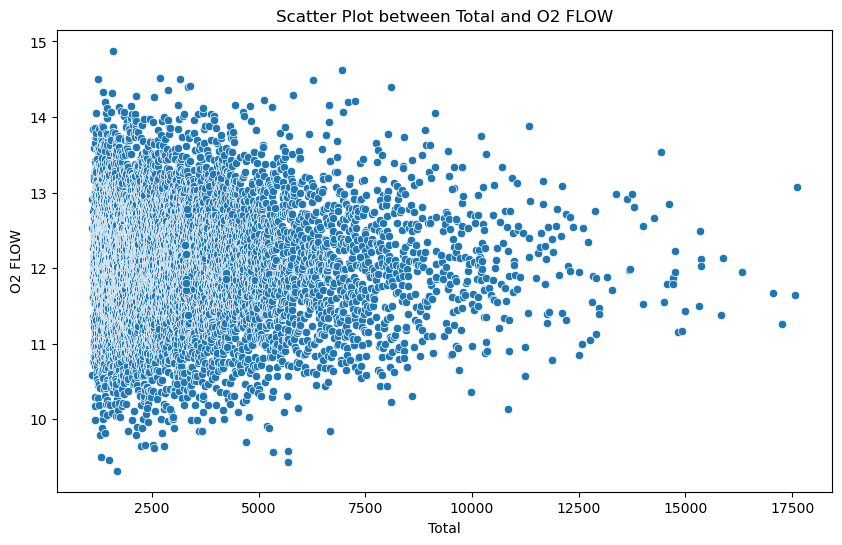

In [11]:
# Scatter Plot
plt.figure(figsize=(10, 6))
sns.scatterplot(x='Total', y=df.columns[1], data=df)  # Assuming df.columns[1] is another numeric column
plt.title('Scatter Plot between Total and ' + df.columns[1])
plt.xlabel('Total')
plt.ylabel(df.columns[1])
plt.show()

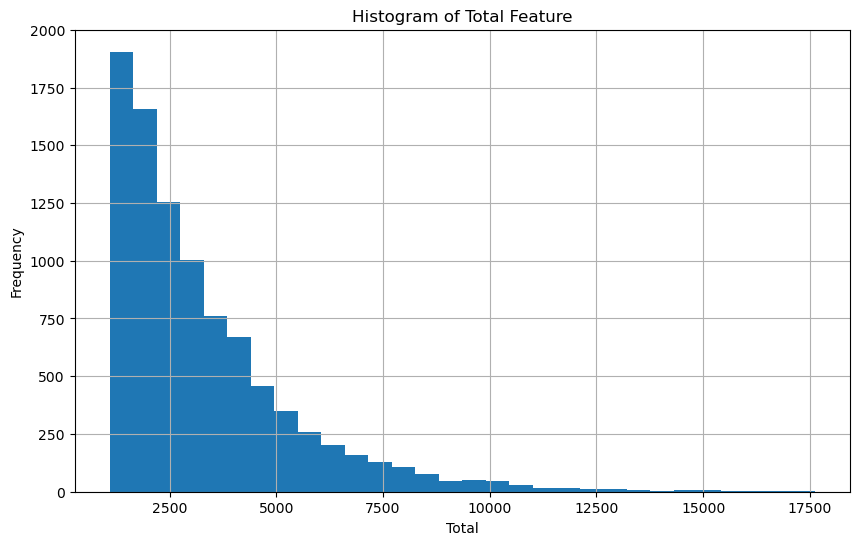

In [12]:
# Histogram
plt.figure(figsize=(10, 6))
df['Total'].hist(bins=30)
plt.title('Histogram of Total Feature')
plt.xlabel('Total')
plt.ylabel('Frequency')
plt.show()


In [13]:
# Handling outliers using IQR method
Q1 = df['Total'].quantile(0.25)
Q3 = df['Total'].quantile(0.75)
IQR = Q3 - Q1
df = df[~((df['Total'] < (Q1 - 1.5 * IQR)) | (df['Total'] > (Q3 + 1.5 * IQR)))]

In [14]:
IQR

2352.32765171165

In [15]:
df

,H2 FLOW,O2 FLOW,SILICA,SUCTION,HTD,TEMP,T SPEED,ROT SPEED,FINAL TIP SPLIT,Total
0,14.278557,11.959736,45.383162,245.0,2.849066,730.949574,0.554771,70.0,7.00,1127.974866
1,15.405924,11.998657,47.735984,241.0,2.018294,723.934370,1.080253,78.0,12.75,1133.923481
2,15.086657,11.735719,44.767447,256.0,2.145396,719.563466,1.239785,84.0,12.00,1146.538469
3,14.647138,12.150333,46.605308,247.0,3.056861,730.191711,1.956044,70.0,10.00,1135.607396
4,17.475638,13.585236,44.571819,241.0,2.753618,731.082674,2.430784,89.0,4.50,1146.399768
...,...,...,...,...,...,...,...,...,...,...
9030,13.795289,10.983790,47.018427,271.0,2.818529,734.453119,6246.270219,80.0,6.25,7412.589374
9031,15.087279,12.153276,45.231837,231.0,3.144367,730.139220,6251.281989,88.0,10.25,7386.287969
9034,14.516156,11.932742,43.773076,233.0,3.234083,735.831097,3118.879535,69.0,9.25,4239.416689
9035,15.351917,11.861880,46.491175,223.0,2.555722,730.902959,3119.459338,76.0,7.75,4233.372991


/Users/aradhya814/anaconda3/lib/python3.11/site-packages/seaborn/axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


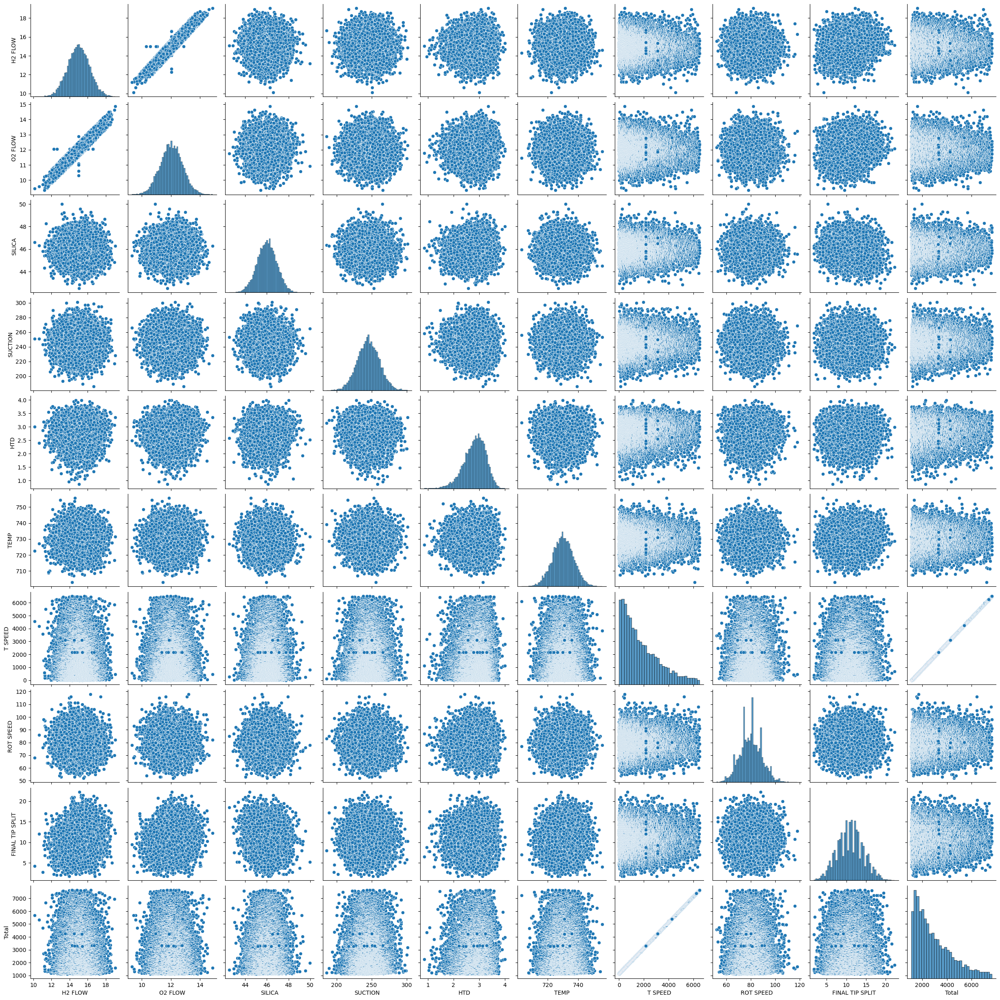

In [16]:
# Exploratory Data Analysis (EDA)
sns.pairplot(df)
plt.show()

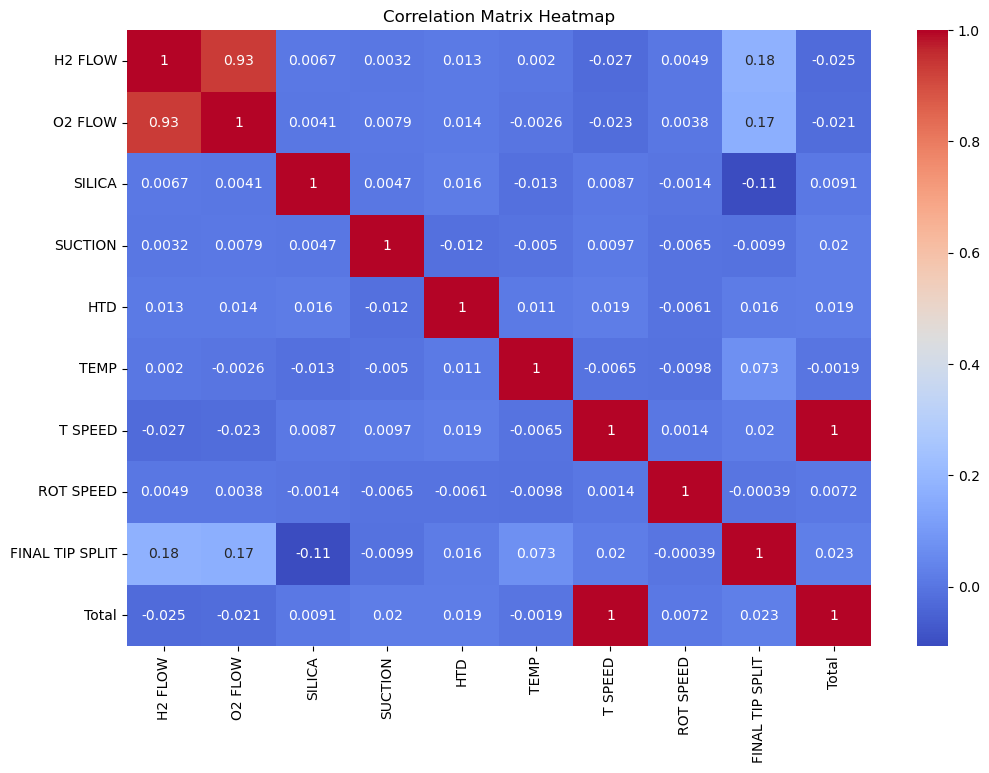

In [17]:
# Correlation Matrix Using Heat-map
plt.figure(figsize=(12, 8))
corr = df.corr()
sns.heatmap(corr, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix Heatmap')
plt.show()

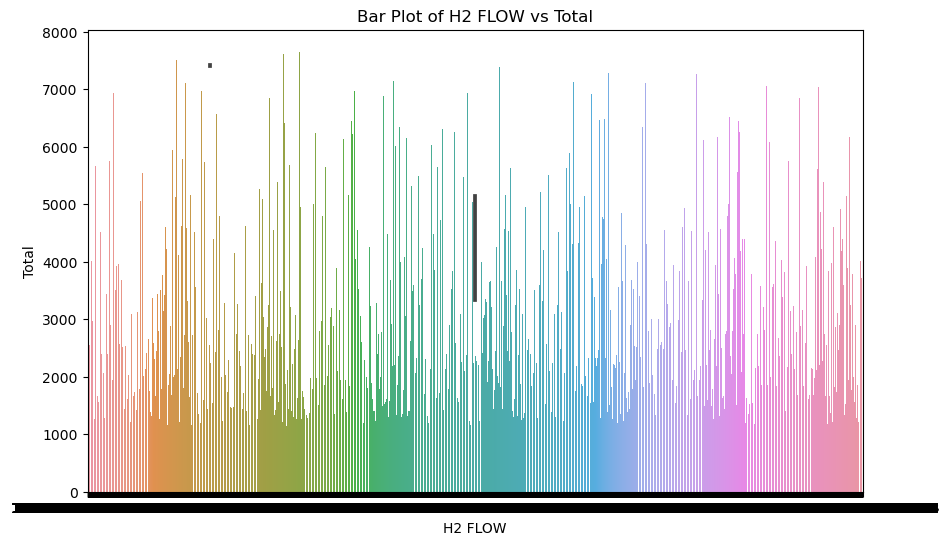

In [18]:
# Bar plot
plt.figure(figsize=(10, 6))
sns.barplot(x=df.columns[0], y='Total', data=df)  # Assuming df.columns[0] is a categorical column
plt.title('Bar Plot of ' + df.columns[0] + ' vs Total')
plt.xlabel(df.columns[0])
plt.ylabel('Total')
plt.show()

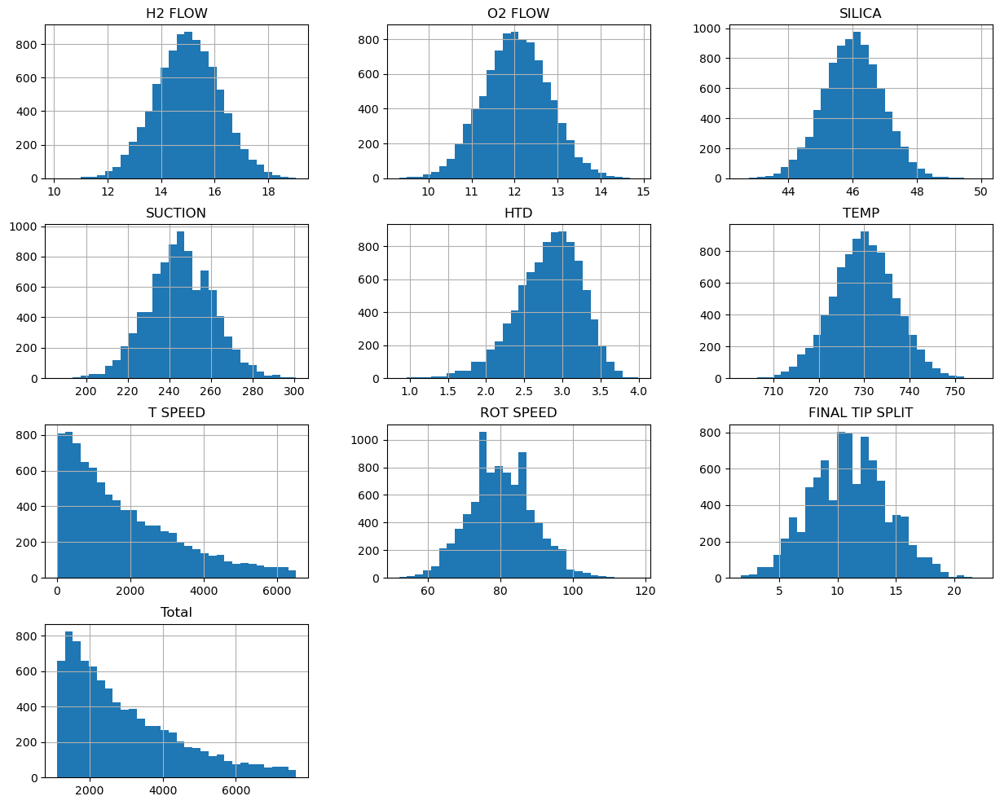

In [19]:
# Distribution of each feature
df.hist(figsize=(15, 12), bins=30)
plt.show()

In [20]:
# Identify relationships between features
# Example: Creating new feature as interaction term between two existing features
df['Interaction'] = df[df.columns[1]] * df[df.columns[2]]  # Assuming df.columns[1] and df.columns[2] are numeric columns

/var/folders/v9/wqt89x5x19x474d778y927kc0000gn/T/ipykernel_61721/1114316109.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Interaction'] = df[df.columns[1]] * df[df.columns[2]]  # Assuming df.columns[1] and df.columns[2] are numeric columns


In [21]:
df

,H2 FLOW,O2 FLOW,SILICA,SUCTION,HTD,TEMP,T SPEED,ROT SPEED,FINAL TIP SPLIT,Total,Interaction
0,14.278557,11.959736,45.383162,245.0,2.849066,730.949574,0.554771,70.0,7.00,1127.974866,542.770652
1,15.405924,11.998657,47.735984,241.0,2.018294,723.934370,1.080253,78.0,12.75,1133.923481,572.767706
2,15.086657,11.735719,44.767447,256.0,2.145396,719.563466,1.239785,84.0,12.00,1146.538469,525.378165
3,14.647138,12.150333,46.605308,247.0,3.056861,730.191711,1.956044,70.0,10.00,1135.607396,566.270021
4,17.475638,13.585236,44.571819,241.0,2.753618,731.082674,2.430784,89.0,4.50,1146.399768,605.518684
...,...,...,...,...,...,...,...,...,...,...,...
9030,13.795289,10.983790,47.018427,271.0,2.818529,734.453119,6246.270219,80.0,6.25,7412.589374,516.440511
9031,15.087279,12.153276,45.231837,231.0,3.144367,730.139220,6251.281989,88.0,10.25,7386.287969,549.714992
9034,14.516156,11.932742,43.773076,233.0,3.234083,735.831097,3118.879535,69.0,9.25,4239.416689,522.332807
9035,15.351917,11.861880,46.491175,223.0,2.555722,730.902959,3119.459338,76.0,7.75,4233.372991,551.472739


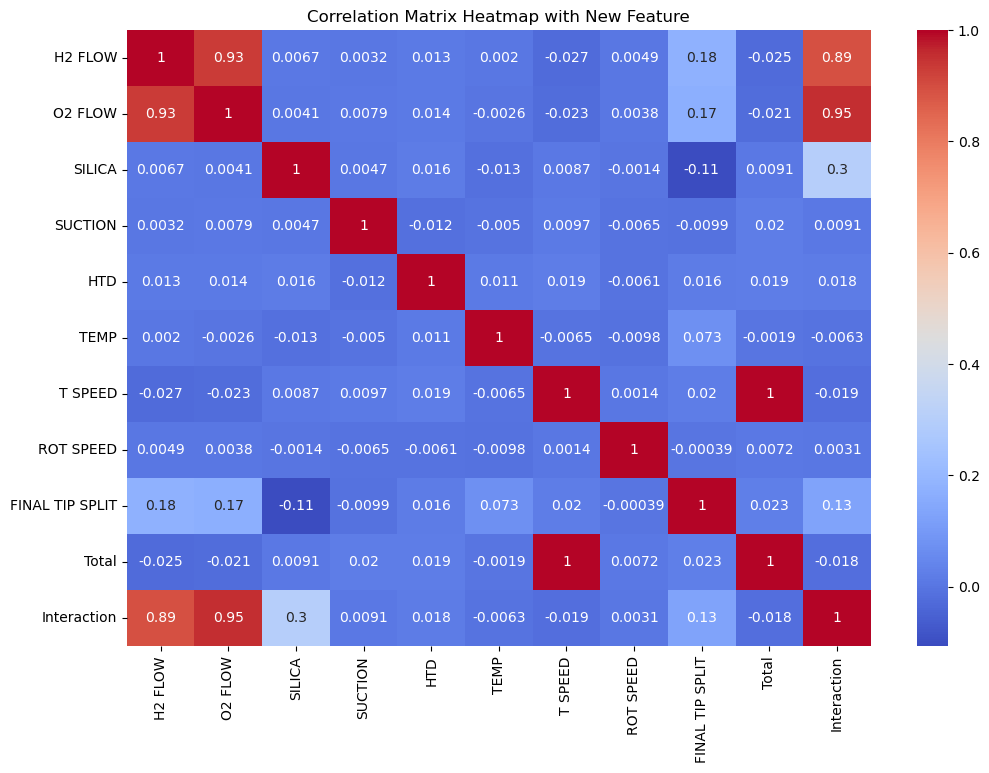

In [22]:
# Correlation heatmap for the new dataset with the engineered feature
plt.figure(figsize=(12, 8))
corr_new = df.corr()
sns.heatmap(corr_new, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix Heatmap with New Feature')
plt.show()

In [23]:
scaler = StandardScaler()
scaled_df = scaler.fit_transform(df.select_dtypes(include=[np.number]))

In [24]:
# Principal Component Analysis (PCA)
pca = PCA(n_components=2)
pca_result = pca.fit_transform(scaled_df)
df['PCA1'] = pca_result[:, 0]
df['PCA2'] = pca_result[:, 1]

/var/folders/v9/wqt89x5x19x474d778y927kc0000gn/T/ipykernel_61721/1601842813.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['PCA1'] = pca_result[:, 0]
/var/folders/v9/wqt89x5x19x474d778y927kc0000gn/T/ipykernel_61721/1601842813.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['PCA2'] = pca_result[:, 1]


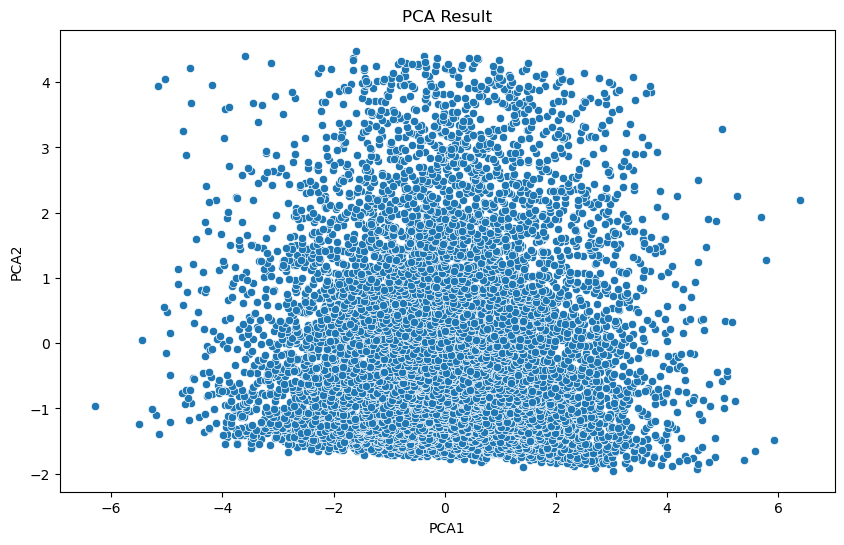

In [25]:
# Scatter plot of PCA results
plt.figure(figsize=(10, 6))
sns.scatterplot(x='PCA1', y='PCA2', data=df)
plt.title('PCA Result')
plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.show()

In [26]:
# K-means clustering
kmeans = KMeans(n_clusters=3)  # Example: 3 clusters
kmeans.fit(scaled_df)
df['Cluster'] = kmeans.labels_

/Users/aradhya814/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/var/folders/v9/wqt89x5x19x474d778y927kc0000gn/T/ipykernel_61721/1520806671.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Cluster'] = kmeans.labels_


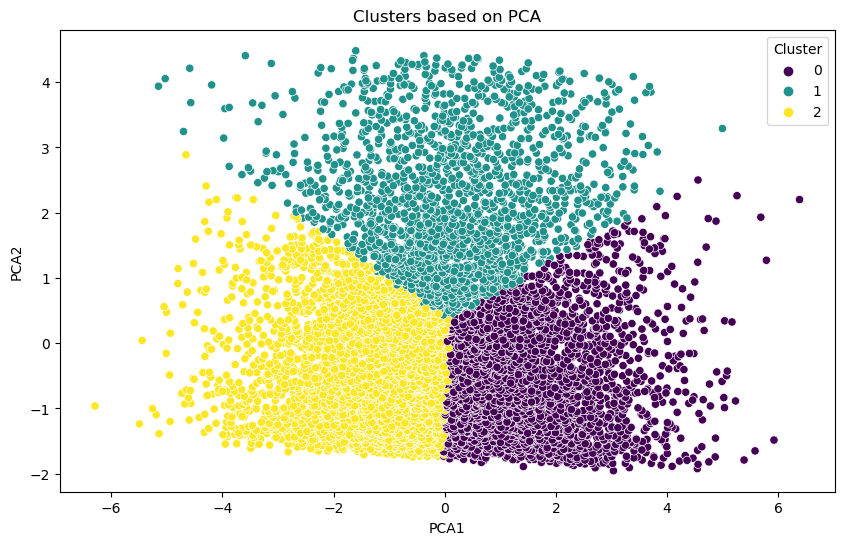

In [27]:
# Scatter plot of clusters
plt.figure(figsize=(10, 6))
sns.scatterplot(x='PCA1', y='PCA2', hue='Cluster', data=df, palette='viridis')
plt.title('Clusters based on PCA')
plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.show()

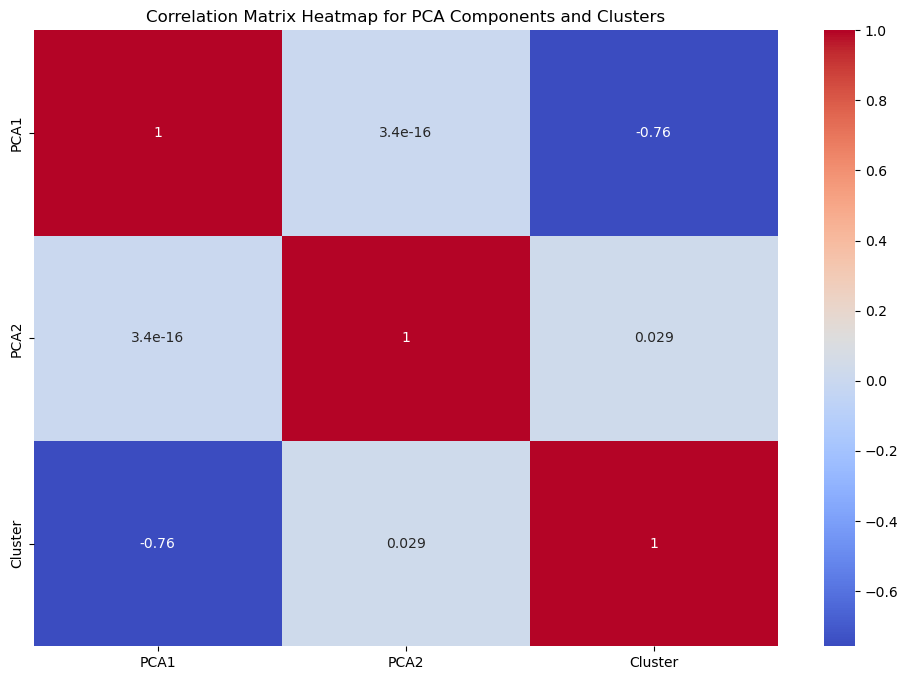

In [28]:
# Correlation Matrix Using Heat-map for PCA components and clusters
plt.figure(figsize=(12, 8))
corr_pca = df[['PCA1', 'PCA2', 'Cluster']].corr()
sns.heatmap(corr_pca, annot=True, cmap='coolwarm')
plt.title('Correlation Matrix Heatmap for PCA Components and Clusters')
plt.show()

In [29]:
# Interactive visualization using Plotly (Example: 3D scatter plot of PCA components)
fig = px.scatter_3d(df, x='PCA1', y='PCA2', z='Total', color='Cluster', title='3D Scatter Plot of PCA Components')
fig.show()

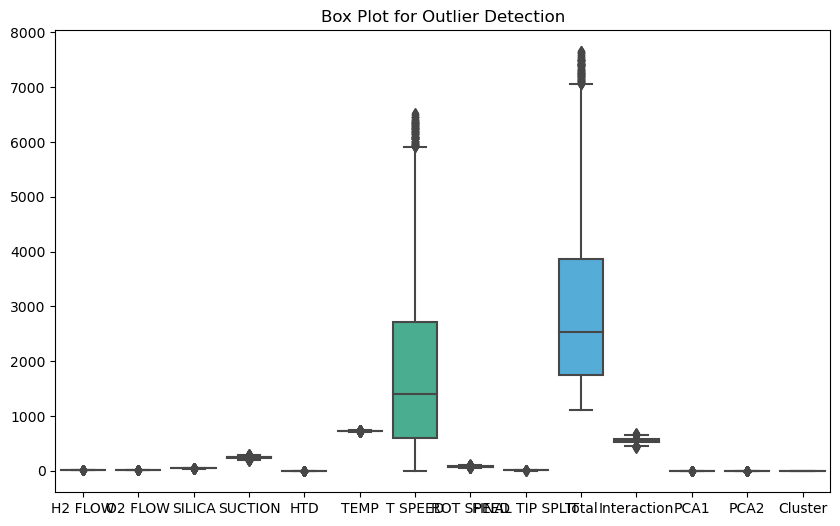

In [30]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df.select_dtypes(include=[np.number]))
plt.title('Box Plot for Outlier Detection')
plt.show()

In [31]:
# Display the modified dataframe
print("Modified DataFrame:")
display(df.head())

Modified DataFrame:


,H2 FLOW,O2 FLOW,SILICA,SUCTION,HTD,TEMP,T SPEED,ROT SPEED,FINAL TIP SPLIT,Total,Interaction,PCA1,PCA2,Cluster
0,14.278557,11.959736,45.383162,245.0,2.849066,730.949574,0.554771,70.0,7.00,1127.974866,542.770652,0.707330,-1.795351,0
1,15.405924,11.998657,47.735984,241.0,2.018294,723.934370,1.080253,78.0,12.75,1133.923481,572.767706,-0.750178,-1.678324,2
2,15.086657,11.735719,44.767447,256.0,2.145396,719.563466,1.239785,84.0,12.00,1146.538469,525.378165,0.635190,-1.760153,0
3,14.647138,12.150333,46.605308,247.0,3.056861,730.191711,1.956044,70.0,10.00,1135.607396,566.270021,-0.221821,-1.679675,2
4,17.475638,13.585236,44.571819,241.0,2.753618,731.082674,2.430784,89.0,4.50,1146.399768,605.518684,-2.815148,-1.664995,2


# Predictive Modeling 


In [32]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression, LinearRegression

from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, mean_squared_error, mean_absolute_error, confusion_matrix


from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_squared_error, r2_score, accuracy_score, classification_report
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVR, SVC
from sklearn.tree import DecisionTreeRegressor, DecisionTreeClassifier
from sklearn.neighbors import KNeighborsRegressor

In [33]:
# Display summary statistics
print(df.describe())

           H2 FLOW      O2 FLOW       SILICA      SUCTION          HTD  \
count  8794.000000  8794.000000  8794.000000  8794.000000  8794.000000   
mean     14.993598    12.038859    46.006891   245.288708     2.822867   
std       1.191612     0.763623     0.907060    15.523252     0.423953   
min      10.117157     9.318286    42.530059   186.000000     0.860012   
25%      14.186521    11.525108    45.393570   235.000000     2.558423   
50%      14.993867    12.041775    46.015267   245.000000     2.866492   
75%      15.805716    12.555633    46.617982   256.000000     3.129392   
max      19.040764    14.876904    49.981548   301.000000     3.995527   

              TEMP      T SPEED    ROT SPEED  FINAL TIP SPLIT        Total  \
count  8794.000000  8794.000000  8794.000000      8794.000000  8794.000000   
mean    729.980748  1827.122341    80.163195        11.009572  2969.426779   
std       6.896606  1520.208366     8.932783         3.264732  1520.486026   
min     702.959534   

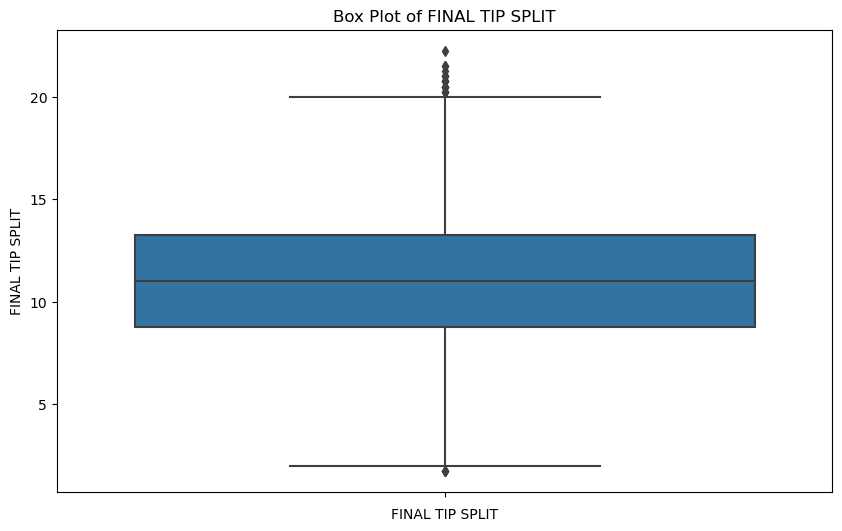

In [34]:
# Construct a box plot for the target variable 'FINAL TIP SPLIT'
plt.figure(figsize=(10, 6))
sns.boxplot(y=df['FINAL TIP SPLIT'])
plt.title('Box Plot of FINAL TIP SPLIT')
plt.xlabel('FINAL TIP SPLIT')
plt.show()

In [35]:
# Define the feature variables (X) and the target variable (y)
X = df.drop('FINAL TIP SPLIT', axis=1)
y = df['FINAL TIP SPLIT']

In [36]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [37]:
X_train

,H2 FLOW,O2 FLOW,SILICA,SUCTION,HTD,TEMP,T SPEED,ROT SPEED,Total,Interaction,PCA1,PCA2,Cluster
2576,12.491014,10.980915,45.114320,223.0,2.766160,726.136322,719.651245,67.0,1813.639976,495.396526,3.113558,-1.296042,0
4556,16.191211,12.841278,46.359058,232.0,2.676483,728.615763,1474.826388,97.0,2625.260181,595.309569,-2.012702,-0.200845,2
2471,15.905112,12.639817,46.342896,236.0,2.620458,739.289238,677.972765,73.0,1815.020287,585.765725,-1.465363,-1.030108,2
5385,15.030701,12.338381,44.691536,262.0,1.641202,727.624696,1913.435168,79.0,3071.511685,551.421214,-0.236779,0.073224,2
1747,13.976625,11.726989,46.785276,235.0,2.646920,734.242541,463.298397,73.0,1589.676748,548.650415,0.747985,-1.348766,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5734,14.671212,11.561872,45.951628,235.0,3.190661,715.117704,2118.386496,70.0,3224.129574,531.286851,0.911224,0.212705,0
5191,15.684824,12.006149,46.910516,253.0,2.832285,724.294361,1804.882363,85.0,2954.610498,563.214658,-0.492204,0.024709,2
5390,13.456300,10.901331,45.285500,237.0,2.543029,720.953496,1917.146157,77.0,3029.285812,493.672217,2.852634,-0.164807,0
860,15.477131,12.516784,44.044262,231.0,2.788193,725.310776,233.602045,84.0,1364.739192,551.292531,-0.642095,-1.453594,2


In [38]:
X_test

,H2 FLOW,O2 FLOW,SILICA,SUCTION,HTD,TEMP,T SPEED,ROT SPEED,Total,Interaction,PCA1,PCA2,Cluster
511,11.820818,9.786798,47.528662,256.0,3.036405,735.001525,142.133105,73.0,1286.057312,465.153417,4.463837,-1.761032,0
509,15.133488,12.270740,45.526420,255.0,2.507884,734.330573,141.135538,54.0,1268.154644,558.642868,-0.221338,-1.628592,2
3288,13.445647,10.861326,47.008486,265.0,3.380876,712.097976,958.132288,107.0,2124.676600,510.574491,2.258002,-0.830590,0
4645,14.552047,11.575497,45.584739,256.0,3.152346,723.181657,1524.613590,82.0,2671.159877,527.666025,0.996632,-0.298365,0
321,13.801856,10.889260,44.983090,260.0,3.264453,735.117781,90.098080,75.0,1250.154520,489.832552,2.161088,-1.619766,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3383,15.370226,12.363772,46.375703,242.0,3.434287,740.978857,994.140167,82.0,2147.663012,573.378603,-0.824280,-0.693745,2
2083,14.199717,11.641262,46.570689,255.0,2.518758,726.641333,558.973747,66.0,1690.045505,542.141574,0.857861,-1.255335,0
4924,13.221999,10.646092,46.239611,247.0,2.328877,727.612627,1662.063114,91.0,2814.112319,492.271147,2.696317,-0.260265,0
5572,16.449297,12.581998,44.814550,243.0,2.007051,713.147810,2024.254772,99.0,3164.255478,563.856572,-1.014147,0.150346,2


In [39]:
y_train

2576     6.50
4556    14.75
2471    11.25
5385    15.75
1747     9.00
        ...  
5734    10.25
5191    10.00
5390     5.00
860     16.00
7270     9.00
Name: FINAL TIP SPLIT, Length: 7035, dtype: float64

In [40]:
y_test

511      7.75
509      8.25
3288     7.75
4645    10.50
321     17.00
        ...  
3383    11.00
2083     8.50
4924    14.00
5572     9.00
2917     8.25
Name: FINAL TIP SPLIT, Length: 1759, dtype: float64

In [41]:
# Function to calculate and display classification metrics
def display_classification_metrics(y_test, y_pred, model_name):
    metrics = {
        "Model": model_name,
        "Accuracy": accuracy_score(y_test, y_pred),
        "Precision": precision_score(y_test, y_pred, average='weighted'),
        "Recall": recall_score(y_test, y_pred, average='weighted'),
        "F1 Score": f1_score(y_test, y_pred, average='weighted'),
        "MSE": mean_squared_error(y_test, y_pred),
        "RMSE": mean_squared_error(y_test, y_pred, squared=False),
        "MAE": mean_absolute_error(y_test, y_pred),
        "Confusion Matrix": confusion_matrix(y_test, y_pred)
    }
    return metrics

### For classification, metrics like accuracy, precision, recall, and F1 score are appropriate. For regression, we use metrics 
### like MSE, RMSE, and MAE.Since FINAL TIP SPLIT is continuous, using a regression model makes sense. 

In [42]:
# Linear Regression
linreg = LinearRegression()
linreg.fit(X_train, y_train)
y_pred_linreg = linreg.predict(X_test)

# Calculate regression metrics
mse = mean_squared_error(y_test, y_pred_linreg)
mae = mean_absolute_error(y_test, y_pred_linreg)
rmse = mean_squared_error(y_test, y_pred_linreg, squared=False)

print("Regression Metrics")
print(f"MSE: {mse}")
print(f"MAE: {mae}")
print(f"RMSE: {rmse}")

Regression Metrics
MSE: 5.34293290009362e-25
MAE: 6.356024922477558e-13
RMSE: 7.309536852697043e-13


In [43]:
# Decision Tree Regression

from sklearn.tree import DecisionTreeRegressor

tree_regressor = DecisionTreeRegressor()
tree_regressor.fit(X_train, y_train)
y_pred_tree = tree_regressor.predict(X_test)

# Function to calculate and display regression metrics
def display_regression_metrics(y_test, y_pred, model_name):
    metrics = {
        "Model": model_name,
        "MSE": mean_squared_error(y_test, y_pred),
        "RMSE": mean_squared_error(y_test, y_pred, squared=False),
        "MAE": mean_absolute_error(y_test, y_pred),
    }
    return metrics

tree_regression_metrics = display_regression_metrics(y_test, y_pred_tree, "Decision Tree Regressor")
print(tree_regression_metrics)

{'Model': 'Decision Tree Regressor', 'MSE': 8.683037026915844, 'RMSE': 2.946699344506637, 'MAE': 2.309857629498121}


In [44]:
# Random Forest Regression

from sklearn.ensemble import RandomForestRegressor

forest_regressor = RandomForestRegressor()
forest_regressor.fit(X_train, y_train)
y_pred_forest = forest_regressor.predict(X_test)

# Function to calculate and display regression metrics
def display_regression_metrics(y_test, y_pred, model_name):
    metrics = {
        "Model": model_name,
        "MSE": mean_squared_error(y_test, y_pred),
        "RMSE": mean_squared_error(y_test, y_pred, squared=False),
        "MAE": mean_absolute_error(y_test, y_pred),
    }
    return metrics

forest_regression_metrics = display_regression_metrics(y_test, y_pred_forest, "Random Forest Regressor")
print(forest_regression_metrics)

{'Model': 'Random Forest Regressor', 'MSE': 4.466840035564413, 'RMSE': 2.1134900131215226, 'MAE': 1.6579429741837917}


In [45]:
# K-Nearest Neighbors Classification
import numpy as np
from sklearn.preprocessing import KBinsDiscretizer
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, mean_squared_error, mean_absolute_error, confusion_matrix

# Convert pandas Series to NumPy arrays and reshape for binning
y_train_array = y_train.to_numpy().reshape(-1, 1)
y_test_array = y_test.to_numpy().reshape(-1, 1)

# Bin continuous target variable into categories
kbins = KBinsDiscretizer(n_bins=4, encode='ordinal', strategy='uniform')
y_train_binned = kbins.fit_transform(y_train_array).astype(int).ravel()
y_test_binned = kbins.transform(y_test_array).astype(int).ravel()

# K-Nearest Neighbors Classification
knn = KNeighborsClassifier()
knn.fit(X_train, y_train_binned)
y_pred_knn = knn.predict(X_test)
knn_metrics = display_classification_metrics(y_test_binned, y_pred_knn, "K-Nearest Neighbors")

print(knn_metrics)

{'Model': 'K-Nearest Neighbors', 'Accuracy': 0.4457077885162024, 'Precision': 0.4023036052026259, 'Recall': 0.4457077885162024, 'F1 Score': 0.4172130546523387, 'MSE': 0.7822626492325184, 'RMSE': 0.8844561318870023, 'MAE': 0.6287663445139283, 'Confusion Matrix': array([[ 12, 129,  48,   2],
       [ 69, 585, 232,   1],
       [ 37, 394, 187,   0],
       [  2,  37,  24,   0]])}


/Users/aradhya814/anaconda3/lib/python3.11/site-packages/sklearn/preprocessing/_discretization.py:239: FutureWarning:

In version 1.5 onwards, subsample=200_000 will be used by default. Set subsample explicitly to silence this warning in the mean time. Set subsample=None to disable subsampling explicitly.



In [50]:
from sklearn.metrics import r2_score

# Function to calculate and display regression metrics
def display_regression_metrics(y_test, y_pred, model_name):
    metrics = {
        "Model": model_name,
        "MSE": mean_squared_error(y_test, y_pred),
        "RMSE": mean_squared_error(y_test, y_pred, squared=False),
        "MAE": mean_absolute_error(y_test, y_pred),
        "R2 Score": r2_score(y_test, y_pred)  # Add R2 Score calculation here
    }
    return metrics


In [51]:
# Logistic Regression Classification
logreg = LogisticRegression(max_iter=1000)
logreg.fit(X_train, y_train_binned)
y_pred_logreg = logreg.predict(X_test)
logreg_metrics = display_classification_metrics(y_test_binned, y_pred_logreg, "Logistic Regression")

# Decision Tree Classification
tree = DecisionTreeClassifier()
tree.fit(X_train, y_train_binned)
y_pred_tree = tree.predict(X_test)
tree_metrics = display_classification_metrics(y_test_binned, y_pred_tree, "Decision Tree")

# Random Forest Classification
forest = RandomForestClassifier()
forest.fit(X_train, y_train_binned)
y_pred_forest = forest.predict(X_test)
forest_metrics = display_classification_metrics(y_test_binned, y_pred_forest, "Random Forest")

# K-Nearest Neighbors Classification
knn = KNeighborsClassifier()
knn.fit(X_train, y_train_binned)
y_pred_knn = knn.predict(X_test)
knn_metrics = display_classification_metrics(y_test_binned, y_pred_knn, "K-Nearest Neighbors")

# Linear Regression
linreg = LinearRegression()
linreg.fit(X_train, y_train)
y_pred_linreg = linreg.predict(X_test)
linreg_metrics = display_regression_metrics(y_test, y_pred_linreg, "Linear Regression")

/Users/aradhya814/anaconda3/lib/python3.11/site-packages/sklearn/linear_model/_logistic.py:460: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression

/Users/aradhya814/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1469: UndefinedMetricWarning:

Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [48]:
# Store all metrics in a list
all_metrics = [logreg_metrics, tree_metrics, forest_metrics, knn_metrics, linreg_metrics]

# Print all metrics
for metrics in all_metrics:
    print(metrics)

{'Model': 'Logistic Regression', 'Accuracy': 0.7765776009096077, 'Precision': 0.6665222787003202, 'Recall': 0.7765776009096077, 'F1 Score': 0.716271805917223, 'MSE': 0.22342239909039227, 'RMSE': 0.4726757864439348, 'MAE': 0.22342239909039227, 'Confusion Matrix': array([[  0, 191,   0,   0],
       [  0, 830,  57,   0],
       [  0,  82, 536,   0],
       [  0,   0,  63,   0]])}
{'Model': 'Decision Tree', 'Accuracy': 0.5429221148379761, 'Precision': 0.5417096319527415, 'Recall': 0.5429221148379761, 'F1 Score': 0.5421938105664421, 'MSE': 0.595793064241046, 'RMSE': 0.7718763270375936, 'MAE': 0.5025582717453099, 'Confusion Matrix': array([[ 49, 109,  32,   1],
       [120, 537, 218,  12],
       [ 20, 218, 354,  26],
       [  1,  12,  35,  15]])}
{'Model': 'Random Forest', 'Accuracy': 0.58726549175668, 'Precision': 0.5699024485430852, 'Recall': 0.58726549175668, 'F1 Score': 0.5336865249240843, 'MSE': 0.45366685616827745, 'RMSE': 0.6735479612976922, 'MAE': 0.42637862421830586, 'Confusion M

In [52]:
# Store all classification model metrics in a list
classification_models = [
    {"Model": "Logistic Regression", "F1 Score": logreg_metrics["F1 Score"], "Accuracy": logreg_metrics["Accuracy"]},
    {"Model": "Decision Tree", "F1 Score": tree_metrics["F1 Score"], "Accuracy": tree_metrics["Accuracy"]},
    {"Model": "Random Forest", "F1 Score": forest_metrics["F1 Score"], "Accuracy": forest_metrics["Accuracy"]},
    {"Model": "K-Nearest Neighbors", "F1 Score": knn_metrics["F1 Score"], "Accuracy": knn_metrics["Accuracy"]}
]

# Store all regression model metrics in a list
regression_models = [
    {"Model": "Linear Regression", "RMSE": linreg_metrics["RMSE"], "R2 Score": linreg_metrics["R2 Score"]}
]

# Find the best classification model
best_classification_model = max(classification_models, key=lambda x: x["F1 Score"])

# Find the best regression model
best_regression_model = min(regression_models, key=lambda x: x["RMSE"])

# Display the best classification model
print("Best Classification Model:")
for key, value in best_classification_model.items():
    if key != "Confusion Matrix":
        print(f"{key}: {value}")

# Display the best regression model
print("\nBest Regression Model:")
for key, value in best_regression_model.items():
    print(f"{key}: {value}")

Best Classification Model:
Model: Logistic Regression
F1 Score: 0.716271805917223
Accuracy: 0.7765776009096077

Best Regression Model:
Model: Linear Regression
RMSE: 7.309536852697043e-13
R2 Score: 1.0


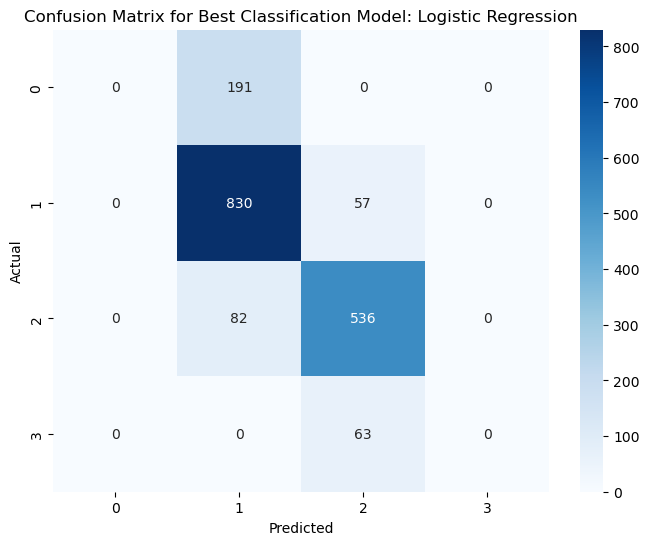

In [58]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, mean_squared_error, mean_absolute_error

# Function to calculate and display regression metrics
def display_regression_metrics(y_test, y_pred, model_name):
    metrics = {
        "Model": model_name,
        "MSE": mean_squared_error(y_test, y_pred),
        "RMSE": mean_squared_error(y_test, y_pred, squared=False),
        "MAE": mean_absolute_error(y_test, y_pred),
        "R2 Score": r2_score(y_test, y_pred)  # Add R2 Score calculation here
    }
    return metrics

# Assuming y_test_binned contains the actual labels and y_pred_* contains the predicted labels for each model
# Replace the following lines with actual variables from your notebook:

# Calculate and display confusion matrix for the best classification model
def plot_confusion_matrix(y_test, y_pred, model_name):
    conf_matrix = confusion_matrix(y_test, y_pred)
    
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
    plt.title(f'Confusion Matrix for Best Classification Model: {model_name}')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

# Determine the best model's predictions based on the F1 Score
if best_classification_model["Model"] == "Logistic Regression":
    y_pred_best = y_pred_logreg
elif best_classification_model["Model"] == "Decision Tree":
    y_pred_best = y_pred_tree
elif best_classification_model["Model"] == "Random Forest":
    y_pred_best = y_pred_forest
elif best_classification_model["Model"] == "K-Nearest Neighbors":
    y_pred_best = y_pred_knn
else:
    raise ValueError("Best model not recognized.")

# Plot the confusion matrix for the best classification model
plot_confusion_matrix(y_test_binned, y_pred_best, best_classification_model["Model"])